# Opción 1

Random Forest para sentiment classifier, buena visualización.

In [1]:
from sklearn.datasets import fetch_20newsgroups
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import make_pipeline
from sklearn.metrics import mean_absolute_error
from lime.lime_text import LimeTextExplainer
import pandas as pd

# Paso 1: Cargar los datos de tu base de datos
data = pd.read_csv("dataset/data.csv", encoding="utf-8")

# Paso 2: Preparar los datos
X = data['Sentence']
y = data['Sentiment']

# Paso 3: Tokenizar el texto usando Vectorizer
vectorizer = TfidfVectorizer(lowercase=False)
X_vectors = vectorizer.fit_transform(X)

# Paso 4: Entrenar el clasificador RandomForest
rf = RandomForestClassifier(n_estimators=500)
rf.fit(X_vectors, y)

# Paso 5: Preparar el pipeline
pipeline = make_pipeline(vectorizer, rf)


In [2]:
import pickle

# Guardar el pipeline en un archivo usando pickle
with open('pipeline.pkl', 'wb') as file:
    pickle.dump(pipeline, file)


In [ ]:
import pickle

# Cargar el pipeline desde el archivo guardado
with open('pipeline.pkl', 'rb') as file:
    pipeline = pickle.load(file)

## LIME

In [3]:
explainer = LimeTextExplainer(class_names=rf.classes_)

In [17]:
# Por ejemplo, expliquemos la predicción para una instancia específica
idx = 48
exp = explainer.explain_instance(X[idx], pipeline.predict_proba, num_features=6, top_labels=4)

In [18]:
print('Document id:', idx)
print('Sentence: ', X[idx])
print('True Sentiment:', y[idx])

predicted_sentiment = rf.predict(X_vectors[idx].toarray())[0]
print('Predicted Sentiment:', predicted_sentiment)

print('Prediction probabilities:')
probabilities = pipeline.predict_proba([X[idx]])
for i, sentiment_class in enumerate(rf.classes_):
    print(f'{sentiment_class}: {probabilities[0][i]}')


Document id: 48
Sentence:  The company also estimates the already carried out investments to lead to an increase in its net sales for 2010 from 2009 when they reached EUR 141.7 million .
True Sentiment: positive
Predicted Sentiment: positive
Prediction probabilities:
negative: 0.02666666666666667
neutral: 0.1313333333333333
positive: 0.842


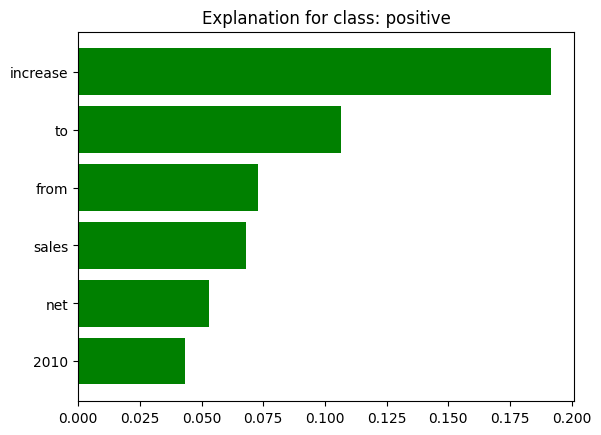

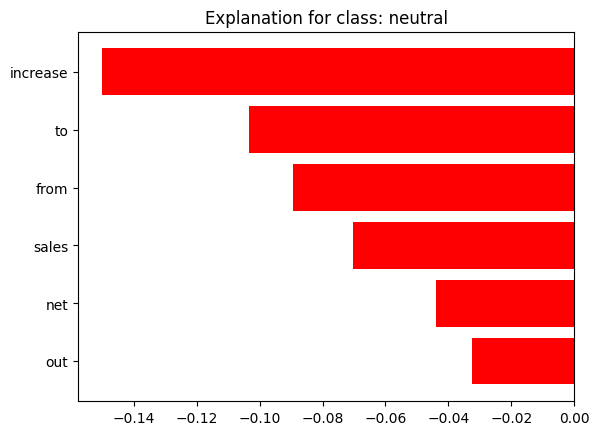

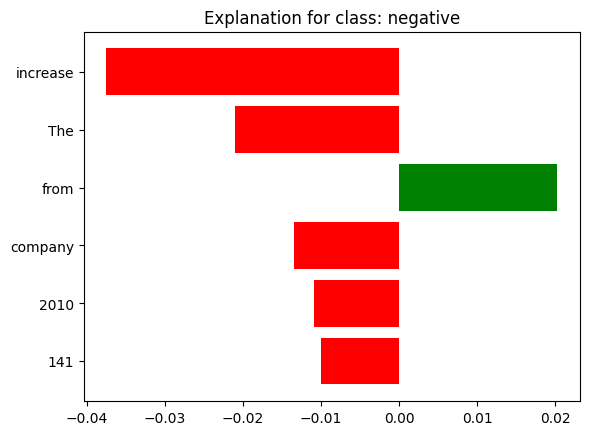

In [19]:
import matplotlib.pyplot as plt

# Obtener las explicaciones para todas las clases
class_names = rf.classes_
for idx, label in enumerate(exp.available_labels()):
    class_name = class_names[label]
    fig = exp.as_pyplot_figure(label)
    plt.title(f'Explanation for class: {class_name}')
    plt.show()

In [6]:
exp.show_in_notebook(text=False)

In [7]:
# Por ejemplo, expliquemos la predicción para una instancia específica
idx = 500
exp = explainer.explain_instance(X[idx], pipeline.predict_proba, num_features=6, top_labels=4)

In [8]:
print('Document id:', idx)
print('Sentence: ', X[idx])
print('True Sentiment:', y[idx])

predicted_sentiment = rf.predict(X_vectors[idx].toarray())[0]
print('Predicted Sentiment:', predicted_sentiment)

print('Prediction probabilities:')
probabilities = pipeline.predict_proba([X[idx]])
for i, sentiment_class in enumerate(rf.classes_):
    print(f'{sentiment_class}: {probabilities[0][i]}')


Document id: 500
Sentence:  The acquisition of +àlandsbanken Sverige in 2009 burdened the performance with EUR 3.0 mn .
True Sentiment: neutral
Predicted Sentiment: neutral
Prediction probabilities:
negative: 0.44410476190476184
neutral: 0.5218952380952382
positive: 0.034


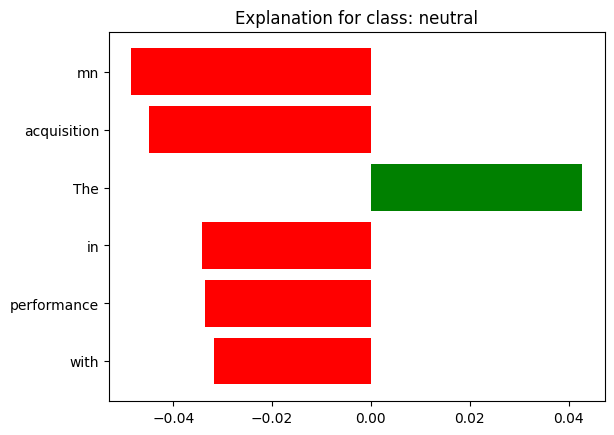

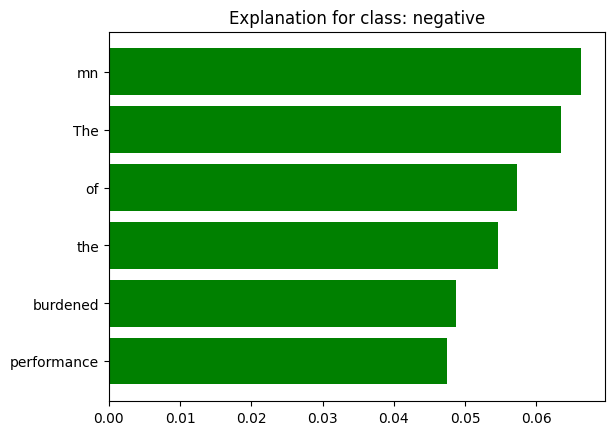

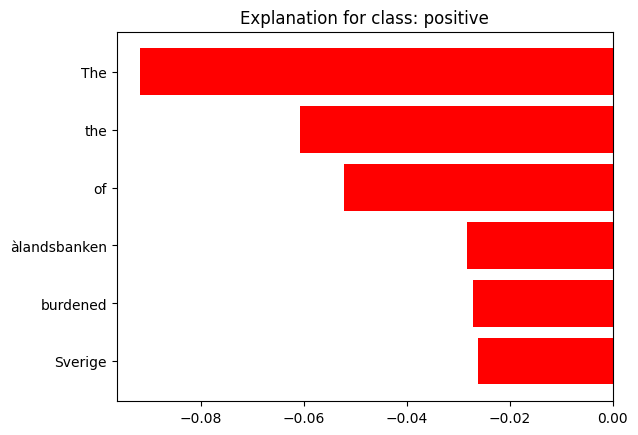

In [9]:
import matplotlib.pyplot as plt

# Obtener las explicaciones para todas las clases
class_names = rf.classes_
for idx, label in enumerate(exp.available_labels()):
    class_name = class_names[label]
    fig = exp.as_pyplot_figure(label)
    plt.title(f'Explanation for class: {class_name}')
    plt.show()

In [10]:
exp.show_in_notebook(text=False)

## SHAP

¿Añadir https://shap.readthedocs.io/en/latest/example_notebooks/text_examples/sentiment_analysis/Positive%20vs.%20Negative%20Sentiment%20Classification.html?

In [2]:
import shap

# Convertir la matriz dispersa a una matriz densa
X_dense = X_vectors.toarray()

# Crear un explainer de SHAP
explainer_shap = shap.TreeExplainer(rf)

# Obtener los valores SHAP para todas las instancias
shap_values = explainer_shap.shap_values(X_dense,approximate=True)

IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html


In [3]:
shap.initjs()

CRASHEA

In [17]:
# Mostrar los valores SHAP
#shap.summary_plot(shap_values, X_dense, feature_names=vectorizer.get_feature_names_out())#

: 

In [4]:
import pickle

# Guardar el explainer de SHAP en un archivo
with open('explainer_shap.pkl', 'wb') as f:
    pickle.dump(explainer_shap, f)

In [6]:
import pickle

# Cargar el explainer de SHAP desde un archivo
with open('explainer_shap.pkl', 'rb') as f:
    explainer_shap_loaded = pickle.load(f)

In [5]:
import numpy as np

# Obtener las dimensiones de la lista shap_values
for i, shap_values_instance in enumerate(shap_values):
    print(f"Dimensiones de shap_values[{i}]: {np.shape(shap_values_instance)}")


Dimensiones de shap_values[0]: (5842, 13128)
Dimensiones de shap_values[1]: (5842, 13128)
Dimensiones de shap_values[2]: (5842, 13128)


In [25]:
# Seleccionar una instancia específica
instance_idx = 10  # Cambia esto al índice de la instancia que deseas explicar

# Mostrar el force plot para la instancia específica
expected_value = explainer_shap.expected_value

print('Sentence: ', X[instance_idx])
print('True Sentiment:', y[instance_idx])

print('Neutral')
shap.force_plot(expected_value[0], shap_values[0][instance_idx], X_dense[instance_idx], feature_names=vectorizer.get_feature_names_out())

Sentence:  Circulation revenue has increased by 5 % in Finland and 4 % in Sweden in 2008 .
True Sentiment: positive
Neutral


In [19]:
print('Negative')
shap.force_plot(expected_value[0], shap_values[1][instance_idx], X_dense[instance_idx], feature_names=vectorizer.get_feature_names_out())

Negative


In [18]:
print('Positive')
shap.force_plot(expected_value[0], shap_values[2][instance_idx], X_dense[instance_idx], feature_names=vectorizer.get_feature_names_out())

Positive


Otra frase.

In [26]:
# Seleccionar una instancia específica
instance_idx = 50  # Cambia esto al índice de la instancia que deseas explicar

# Mostrar el force plot para la instancia específica
expected_value = explainer_shap.expected_value

print('Sentence: ', X[instance_idx])
print('True Sentiment:', y[instance_idx])

print('Neutral')
shap.force_plot(expected_value[0], shap_values[0][instance_idx], X_dense[instance_idx], feature_names=vectorizer.get_feature_names_out())

Sentence:  The six breweries recorded a 5.2 percent growth in domestic beer sales last year to 270.21 million liters , from 256.88 million liters sold in 2005 .
True Sentiment: positive
Neutral


In [22]:
print('Negative')
shap.force_plot(expected_value[0], shap_values[1][instance_idx], X_dense[instance_idx], feature_names=vectorizer.get_feature_names_out())

Negative


In [23]:
print('Positive')
shap.force_plot(expected_value[0], shap_values[2][instance_idx], X_dense[instance_idx], feature_names=vectorizer.get_feature_names_out())

Positive


# Opción 2

Red Neuronal con keras para sentiment classifier, problema de visualización.

In [130]:
#Importing necessary libraries
import nltk
import pandas as pd
from textblob import Word
from nltk.corpus import stopwords
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import classification_report,confusion_matrix,accuracy_score
from keras.models import Sequential
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
from keras.layers import Dense, Embedding, LSTM, SpatialDropout1D
from sklearn.model_selection import train_test_split 
from keras.utils import to_categorical

#Loading the dataset
data = pd.read_csv('dataset/data.csv')

#Pre-Processing the text 
def cleaning(df, stop_words):
    df['Sentence'] = df['Sentence'].apply(lambda x: ' '.join(x.lower() for x in x.split()))
    # Replacing the digits/numbers
    df['Sentence'] = df['Sentence'].str.replace('d', '')
    # Removing stop words
    df['Sentence'] = df['Sentence'].apply(lambda x: ' '.join(x for x in x.split() if x not in stop_words))
    # Lemmatization
    df['Sentence'] = df['Sentence'].apply(lambda x: ' '.join([Word(x).lemmatize() for x in x.split()]))
    return df
stop_words = stopwords.words('english')
data_cleaned = cleaning(data, stop_words)

# División de datos en características y etiquetas
X = data_cleaned['Sentence']
y = data_cleaned['Sentiment']

# Codificación de etiquetas
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)

# División en datos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
# Codificar las etiquetas en formato one-hot
y_train_one_hot = to_categorical(y_train)
y_test_one_hot = to_categorical(y_test)

# Generating embeddings and padding for training data
tokenizer = Tokenizer(num_words=500, split=' ') 
tokenizer.fit_on_texts(X_train)
X_train = tokenizer.texts_to_sequences(X_train)
X_train = pad_sequences(X_train)

# Generating embeddings and padding for testing data
X_test = tokenizer.texts_to_sequences(X_test)
X_test = pad_sequences(X_test, maxlen=X_train.shape[1])  # Padding with the same length as training data

# Model Building
model = Sequential()
model.add(Embedding(500, 120, input_length=X_train.shape[1]))  # Utiliza la longitud máxima de las secuencias en X_train
model.add(SpatialDropout1D(0.4))
model.add(LSTM(704, dropout=0.2, recurrent_dropout=0.2))
model.add(Dense(352, activation='relu'))
model.add(Dense(3, activation='softmax'))
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
print(model.summary())

# Model Training
model.fit(X_train, y_train_one_hot, epochs=20, batch_size=32, verbose=1)

# Model Testing
model.evaluate(X_test, y_test_one_hot)

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_4 (Embedding)     (None, 51, 120)           60000     
                                                                 
 spatial_dropout1d_4 (Spati  (None, 51, 120)           0         
 alDropout1D)                                                    
                                                                 
 lstm_4 (LSTM)               (None, 704)               2323200   
                                                                 
 dense_8 (Dense)             (None, 352)               248160    
                                                                 
 dense_9 (Dense)             (None, 3)                 1059      
                                                                 
Total params: 2632419 (10.04 MB)
Trainable params: 2632419 (10.04 MB)
Non-trainable params: 0 (0.00 Byte)
______________

KeyboardInterrupt: 

In [ ]:
model

In [ ]:
# Guardar el modelo
model.save('modelo_lstm.h5')

/home/gregorio/.local/lib/python3.8/site-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [131]:
from keras.models import load_model

# Cargar el modelo
model = load_model('modelo_lstm.h5')


## LIME

In [121]:
from lime import lime_text
from lime.lime_text import LimeTextExplainer

In [122]:
explainer = LimeTextExplainer(class_names=['Negative', 'Neutral', 'Positive'])


In [123]:
def predict_fn(texts):
    sequences = tokenizer.texts_to_sequences(texts)
    sequences = pad_sequences(sequences, maxlen=X_train.shape[1])
    predictions = model.predict(sequences)
    return predictions

In [128]:
idx = 10  # Índice del ejemplo que deseas explicar
exp = explainer.explain_instance(str(X_test[idx]), predict_fn, num_features=10)


157/157 [==============================] - 34s 214ms/step


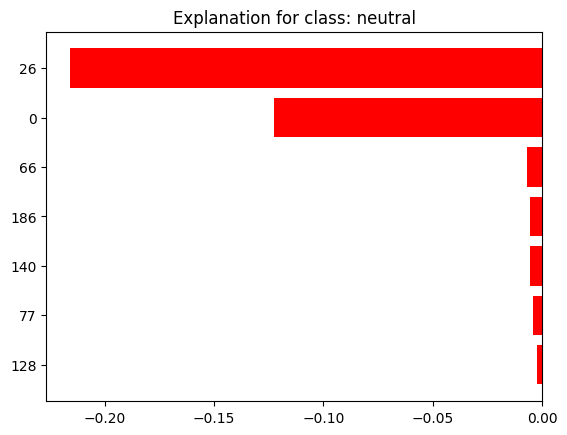

In [125]:
import matplotlib.pyplot as plt

# Obtener las explicaciones para todas las clases
class_names = rf.classes_
for idx, label in enumerate(exp.available_labels()):
    class_name = class_names[label]
    fig = exp.as_pyplot_figure(label)
    plt.title(f'Explanation for class: {class_name}')
    plt.show()

In [126]:
print(str(X_test[idx]))
exp.show_in_notebook(text=str(X_test[idx]))

[  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0 140 128  77 186  26  66]


In [76]:
# Convertir los índices de palabras nuevamente a texto
decoded_text = tokenizer.sequences_to_texts([X_test[idx]])[0]

# Mostrar el texto decodificado
print(decoded_text)


employee woul plant support group unit


In [77]:
exp.show_in_notebook(text=decoded_text)

In [78]:
# Obtener el texto original a partir de los índices de palabras
original_text = ' '.join([tokenizer.index_word[idx] for idx in X_test[idx] if idx != 0])

# Mostrar el texto original
print(original_text)

employee woul plant support group unit


In [79]:
exp.show_in_notebook(text=original_text)

# Opción 3

Clasificacion 20 grupos

In [80]:
from sklearn.datasets import fetch_20newsgroups
import pandas as pd

newsgroups_train = fetch_20newsgroups(subset='train', shuffle=True)
display(newsgroups_train.target_names)

['alt.atheism',
 'comp.graphics',
 'comp.os.ms-windows.misc',
 'comp.sys.ibm.pc.hardware',
 'comp.sys.mac.hardware',
 'comp.windows.x',
 'misc.forsale',
 'rec.autos',
 'rec.motorcycles',
 'rec.sport.baseball',
 'rec.sport.hockey',
 'sci.crypt',
 'sci.electronics',
 'sci.med',
 'sci.space',
 'soc.religion.christian',
 'talk.politics.guns',
 'talk.politics.mideast',
 'talk.politics.misc',
 'talk.religion.misc']

In [83]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfTransformer

count_vect = CountVectorizer()
X_train_counts = count_vect.fit_transform(newsgroups_train.data)

tfidf_transformer = TfidfTransformer()
X_train_tfidf = tfidf_transformer.fit_transform(X_train_counts)

In [85]:
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import accuracy_score
classifier = MultinomialNB()
classifier.fit(X_train_tfidf, newsgroups_train.target)
newsgroups_test = fetch_20newsgroups(subset='test', shuffle=True)
X_test_counts = count_vect.transform(newsgroups_test.data)
X_test_tfidf = tfidf_transformer.transform(X_test_counts)
y_pred = classifier.predict(X_test_tfidf)
print(f"Accuracy Score: {accuracy_score(newsgroups_test.target, y_pred)}")

Accuracy Score: 0.7738980350504514


In [87]:
from lime.lime_text import LimeTextExplainer
from sklearn.pipeline import make_pipeline
pipeline = make_pipeline(count_vect, tfidf_transformer, classifier)
sample_data = newsgroups_test.data[2]
explainer = LimeTextExplainer(class_names=newsgroups_train.target_names)
exp = explainer.explain_instance(sample_data, pipeline.predict_proba, num_features=6, top_labels=1)
exp.show_in_notebook(text=False)

ANTIGUAS PASAR

# BOW

In [25]:
#Loading the Dataset
import pandas as pd
data = pd.read_csv('dataset/data.csv')
#Pre-Prcoessing and Bag of Word Vectorization using Count Vectorizer
from sklearn.feature_extraction.text import CountVectorizer
from nltk.tokenize import RegexpTokenizer
token = RegexpTokenizer(r'[a-zA-Z0-9]+')
cv = CountVectorizer(stop_words='english',ngram_range = (1,1),tokenizer = token.tokenize)
text_counts = cv.fit_transform(data['Sentence'])
#Splitting the data into trainig and testing
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(text_counts, data['Sentiment'], test_size=0.25, random_state=5)
#Training the model
from sklearn.naive_bayes import MultinomialNB
MNB = MultinomialNB()
MNB.fit(X_train, Y_train)
#Caluclating the accuracy score of the model
from sklearn import metrics
predicted = MNB.predict(X_test)
accuracy_score = metrics.accuracy_score(predicted, Y_test)
print("Accuracuy Score: ",accuracy_score)

Accuracuy Score:  0.6851471594798083


/home/gregorio/.local/lib/python3.8/site-packages/sklearn/feature_extraction/text.py:525: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


In [28]:
print(X_test[0])
MNB.predict(X_test[0])

  (0, 49)	1
  (0, 6912)	1
  (0, 7924)	1
  (0, 2519)	1
  (0, 3753)	2
  (0, 6628)	1
  (0, 375)	1
  (0, 3250)	1
  (0, 374)	1
  (0, 254)	1
  (0, 7351)	1
  (0, 1254)	1


array(['neutral'], dtype='<U8')

## Libreria transformers

In [41]:
import transformers

/home/gregorio/.local/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [42]:
from transformers import pipeline
sentiment_pipeline = pipeline("sentiment-analysis")
data = ["It was the best of times.", "t was the worst of times."]
sentiment_pipeline(data)

No model was supplied, defaulted to distilbert/distilbert-base-uncased-finetuned-sst-2-english and revision af0f99b (https://huggingface.co/distilbert/distilbert-base-uncased-finetuned-sst-2-english).
Using a pipeline without specifying a model name and revision in production is not recommended.
/home/gregorio/.local/lib/python3.8/site-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
2024-05-05 13:42:07.785165: W tensorflow/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 93763584 exceeds 10% of free system memory.
2024-05-05 13:42:07.962710: W tensorflow/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 93763584 exceeds 10% of free system memory.
2024-05-05 13:42:07.992748: W tensorflow/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 93763584 exceeds 10% of free system 

[{'label': 'POSITIVE', 'score': 0.9994569420814514},
 {'label': 'NEGATIVE', 'score': 0.9987302422523499}]